In [9]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import date

In [11]:
hr_data = pd.read_csv('HRDataset.csv')

In [12]:
hr_data.head()

,Employee_Name,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,...,ManagerName,ManagerID,RecruitmentSource,PerformanceScore,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,LastPerformanceReview_Date,DaysLateLast30,Absences
0,"Adinolfi, Wilson K",10026,0,0,1,1,5,4,0,62506,...,Michael Albert,22.0,LinkedIn,Exceeds,4.60,5,0,1/17/2019,0,1
1,"Ait Sidi, Karthikeyan",10084,1,1,1,5,3,3,0,104437,...,Simon Roup,4.0,Indeed,Fully Meets,4.96,3,6,2/24/2016,0,17
2,"Akinkuolie, Sarah",10196,1,1,0,5,5,3,0,64955,...,Kissy Sullivan,20.0,LinkedIn,Fully Meets,3.02,3,0,5/15/2012,0,3
3,"Alagbe,Trina",10088,1,1,0,1,5,3,0,64991,...,Elijiah Gray,16.0,Indeed,Fully Meets,4.84,5,0,1/3/2019,0,15
4,"Anderson, Carol",10069,0,2,0,5,5,3,0,50825,...,Webster Butler,39.0,Google Search,Fully Meets,5.00,4,0,2/1/2016,0,2


In [13]:
print("Shape: ",hr_data.shape)
print("Length: ",len(hr_data))
print("Size: ",hr_data.size)

Shape:  (311, 36)
Length:  311
Size:  11196


In [14]:
hr_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311 entries, 0 to 310
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Employee_Name               311 non-null    object 
 1   EmpID                       311 non-null    int64  
 2   MarriedID                   311 non-null    int64  
 3   MaritalStatusID             311 non-null    int64  
 4   GenderID                    311 non-null    int64  
 5   EmpStatusID                 311 non-null    int64  
 6   DeptID                      311 non-null    int64  
 7   PerfScoreID                 311 non-null    int64  
 8   FromDiversityJobFairID      311 non-null    int64  
 9   Salary                      311 non-null    int64  
 10  Termd                       311 non-null    int64  
 11  PositionID                  311 non-null    int64  
 12  Position                    311 non-null    object 
 13  State                       311 non

In [15]:
Categoricalcolumns=hr_data.select_dtypes(include=["object"]).columns
print("The number of Categorical columns are:",len(Categoricalcolumns))

The number of Categorical columns are: 18


In [16]:
Categoricalcolumns

Index(['Employee_Name', 'Position', 'State', 'DOB', 'Sex', 'MaritalDesc',
       'CitizenDesc', 'HispanicLatino', 'RaceDesc', 'DateofHire',
       'DateofTermination', 'TermReason', 'EmploymentStatus', 'Department',
       'ManagerName', 'RecruitmentSource', 'PerformanceScore',
       'LastPerformanceReview_Date'],
      dtype='object')

In [17]:
Numericalcolumns=hr_data.select_dtypes(include=["int64","float"]).columns
print("The number of Numerical columns are:",len(Numericalcolumns))

The number of Numerical columns are: 18


In [18]:
Numericalcolumns

Index(['EmpID', 'MarriedID', 'MaritalStatusID', 'GenderID', 'EmpStatusID',
       'DeptID', 'PerfScoreID', 'FromDiversityJobFairID', 'Salary', 'Termd',
       'PositionID', 'Zip', 'ManagerID', 'EngagementSurvey', 'EmpSatisfaction',
       'SpecialProjectsCount', 'DaysLateLast30', 'Absences'],
      dtype='object')

In [19]:
hr_data.describe()

,EmpID,MarriedID,MaritalStatusID,GenderID,EmpStatusID,DeptID,PerfScoreID,FromDiversityJobFairID,Salary,Termd,PositionID,Zip,ManagerID,EngagementSurvey,EmpSatisfaction,SpecialProjectsCount,DaysLateLast30,Absences
count,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,311.000000,303.000000,311.000000,311.000000,311.000000,311.000000,311.000000
mean,10156.000000,0.398714,0.810289,0.434084,2.392283,4.610932,2.977492,0.093248,69020.684887,0.334405,16.845659,6555.482315,14.570957,4.110000,3.890675,1.218650,0.414791,10.237942
std,89.922189,0.490423,0.943239,0.496435,1.794383,1.083487,0.587072,0.291248,25156.636930,0.472542,6.223419,16908.396884,8.078306,0.789938,0.909241,2.349421,1.294519,5.852596
min,10001.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,45046.000000,0.000000,1.000000,1013.000000,1.000000,1.120000,1.000000,0.000000,0.000000,1.000000
25%,10078.500000,0.000000,0.000000,0.000000,1.000000,5.000000,3.000000,0.000000,55501.500000,0.000000,18.000000,1901.500000,10.000000,3.690000,3.000000,0.000000,0.000000,5.000000
50%,10156.000000,0.000000,1.000000,0.000000,1.000000,5.000000,3.000000,0.000000,62810.000000,0.000000,19.000000,2132.000000,15.000000,4.280000,4.000000,0.000000,0.000000,10.000000
75%,10233.500000,1.000000,1.000000,1.000000,5.000000,5.000000,3.000000,0.000000,72036.000000,1.000000,20.000000,2355.000000,19.000000,4.700000,5.000000,0.000000,0.000000,15.000000
max,10311.000000,1.000000,4.000000,1.000000,5.000000,6.000000,4.000000,1.000000,250000.000000,1.000000,30.000000,98052.000000,39.000000,5.000000,5.000000,8.000000,6.000000,20.000000


<AxesSubplot:>

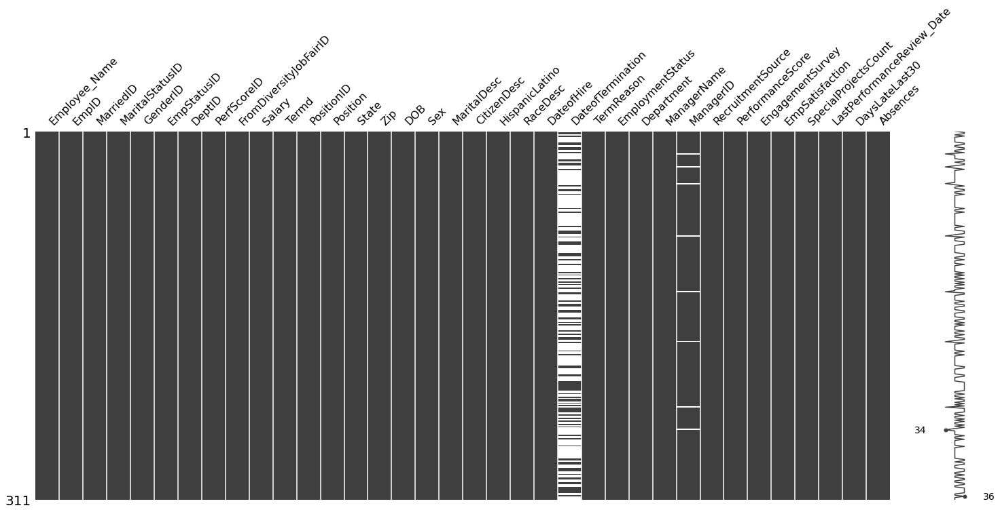

In [11]:
import missingno as mn
mn.matrix(hr_data)

In [12]:
hr_data.isnull().sum()

Employee_Name                   0
EmpID                           0
MarriedID                       0
MaritalStatusID                 0
GenderID                        0
EmpStatusID                     0
DeptID                          0
PerfScoreID                     0
FromDiversityJobFairID          0
Salary                          0
Termd                           0
PositionID                      0
Position                        0
State                           0
Zip                             0
DOB                             0
Sex                             0
MaritalDesc                     0
CitizenDesc                     0
HispanicLatino                  0
RaceDesc                        0
DateofHire                      0
DateofTermination             207
TermReason                      0
EmploymentStatus                0
Department                      0
ManagerName                     0
ManagerID                       8
RecruitmentSource               0
PerformanceSco

In [13]:
hr_data['LastPerformanceReview_Date'] = pd.to_datetime(hr_data['LastPerformanceReview_Date']) 
hr_data['DOB'] = pd.to_datetime(hr_data['DOB']) 
hr_data['DateofHire'] = pd.to_datetime(hr_data['DateofHire']) 

In [14]:
current_year = date.today().year
hr_data['Age'] = abs(current_year - pd.DatetimeIndex(hr_data['DOB']).year)

<AxesSubplot:>

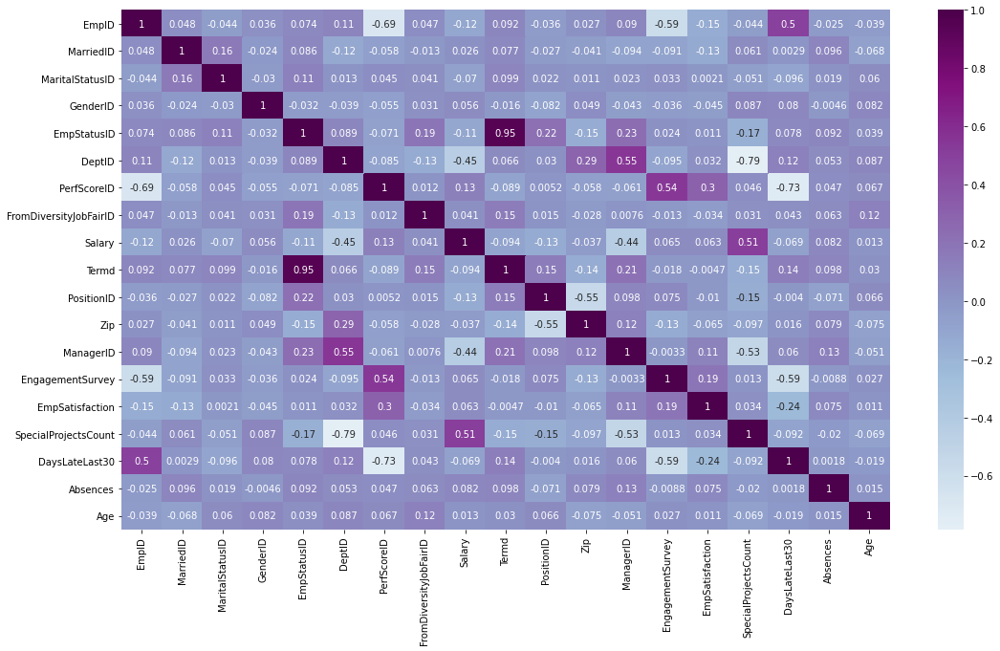

In [15]:
from matplotlib import colors
corrmat= hr_data.corr()
plt.figure(figsize=(18,10))  
sns.heatmap(corrmat,annot=True, cmap="BuPu", center=0)

In [16]:
hr_data['Sex'].value_counts()

F     176
M     135
Name: Sex, dtype: int64

<AxesSubplot:xlabel='Sex', ylabel='count'>

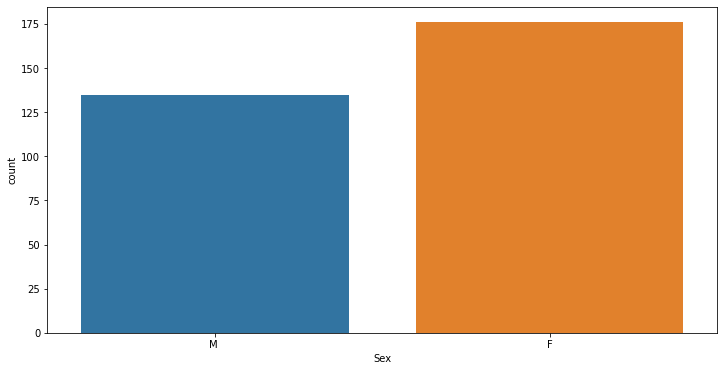

In [17]:
plt.figure(figsize=(12,6))
sns.countplot(x = "Sex", data=hr_data)

In [18]:
x=hr_data.groupby("Sex")["EmpID"].count()/hr_data["EmpID"].count()
x

Sex
F     0.565916
M     0.434084
Name: EmpID, dtype: float64

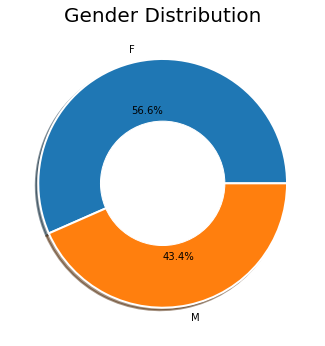

In [19]:
plt.figure(figsize=(5,5))
plt.pie(x,labels=x.index,wedgeprops = { 'linewidth' : 2, 'edgecolor' : 'white' },autopct='%2.1f%%',shadow=True)
plt.rc("font",size=13)
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Gender Distribution",size=20,loc="center")
plt.tight_layout()

In [20]:
hr_data['CitizenDesc'].value_counts()

US Citizen             295
Eligible NonCitizen     12
Non-Citizen              4
Name: CitizenDesc, dtype: int64

<AxesSubplot:xlabel='CitizenDesc', ylabel='count'>

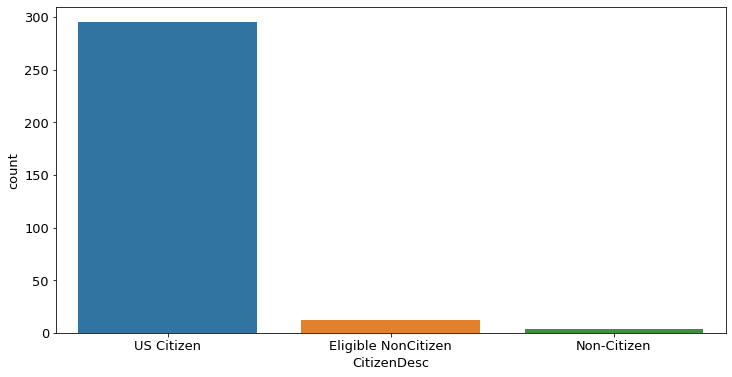

In [21]:
plt.figure(figsize=(12,6))
sns.countplot(x = "CitizenDesc", data=hr_data)

In [22]:
Y=hr_data.groupby("CitizenDesc")["EmpID"].count()/hr_data["EmpID"].count()
Y

CitizenDesc
Eligible NonCitizen    0.038585
Non-Citizen            0.012862
US Citizen             0.948553
Name: EmpID, dtype: float64

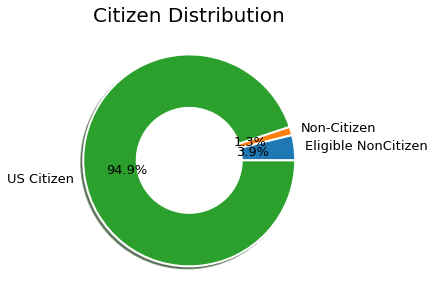

In [23]:
plt.figure(figsize=(6,6))
plt.pie(Y,labels=Y.index,wedgeprops = { 'linewidth' : 2, 'edgecolor' : 'white' },autopct='%2.1f%%',shadow=True)
plt.rc("font",size=13)
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Citizen Distribution",size=20,loc="center")
plt.tight_layout()

In [24]:
hr_data['RaceDesc'].value_counts()

White                               187
Black or African American            80
Asian                                29
Two or more races                    11
American Indian or Alaska Native      3
Hispanic                              1
Name: RaceDesc, dtype: int64

<AxesSubplot:xlabel='RaceDesc', ylabel='count'>

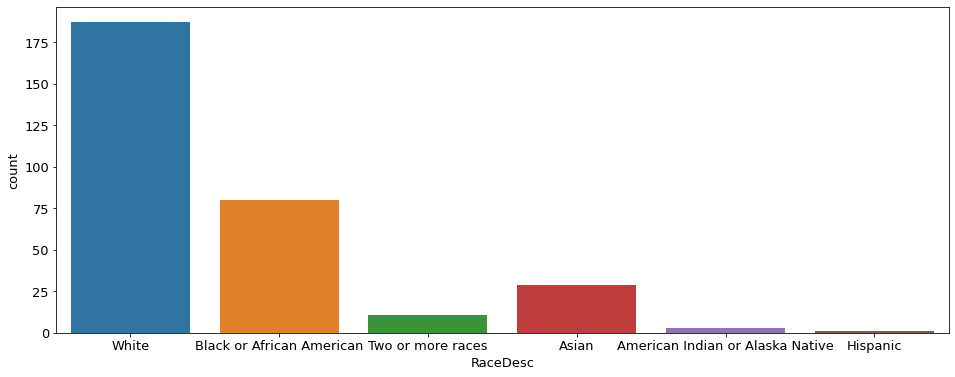

In [25]:
plt.figure(figsize=(16,6))
sns.countplot(x = "RaceDesc", data=hr_data)

In [26]:
Z=hr_data.groupby("RaceDesc")["EmpID"].count()/hr_data["EmpID"].count()
Z

RaceDesc
American Indian or Alaska Native    0.009646
Asian                               0.093248
Black or African American           0.257235
Hispanic                            0.003215
Two or more races                   0.035370
White                               0.601286
Name: EmpID, dtype: float64

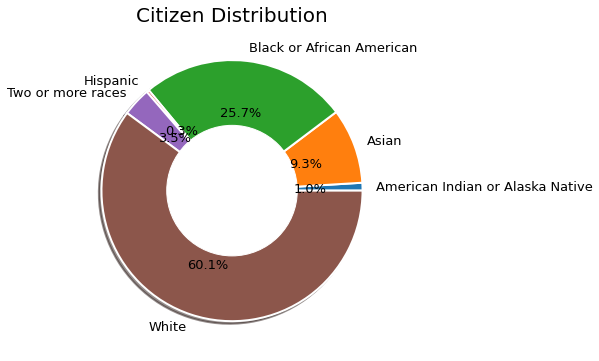

In [27]:
plt.figure(figsize=(8,8))
plt.pie(Z,labels=Z.index,wedgeprops = { 'linewidth' : 2, 'edgecolor' : 'white' },autopct='%2.1f%%',shadow=True)
plt.rc("font",size=13)
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title("Citizen Distribution",size=20,loc="center")
plt.tight_layout()

In [28]:
grouped_data = hr_data.groupby(['Sex','Department']).size().reset_index()
grouped_data.columns = ['Sex','Department','Count']
grouped_data = grouped_data.sort_values('Count', ascending = False)
px.bar(grouped_data, 
       x = 'Department', 
       y = 'Count', 
       color='Sex', 
       title = 'Numbers of Gender accross Department')

In [29]:
grouped_data = hr_data.groupby(['RaceDesc','Department']).size().reset_index()
grouped_data.columns = ['RaceDesc','Department','Count']
grouped_data = grouped_data.sort_values('Count', ascending = False)
px.bar(grouped_data, 
       x = 'Department', 
       y = 'Count', 
       color='RaceDesc', 
       title = 'Numbers of Race accross Department')

In [30]:
grouped_data = hr_data.groupby(['CitizenDesc','Department']).size().reset_index()
grouped_data.columns = ['CitizenDesc','Department','Count']
grouped_data = grouped_data.sort_values('Count', ascending = False)
px.bar(grouped_data, 
       x = 'Department', 
       y = 'Count', 
       color='CitizenDesc', 
       title = 'Numbers of Citizen accross Department')

In [31]:
hr_data["RecruitmentSource"].value_counts()

Indeed                     87
LinkedIn                   76
Google Search              49
Employee Referral          31
Diversity Job Fair         29
CareerBuilder              23
Website                    13
Other                       2
On-line Web application     1
Name: RecruitmentSource, dtype: int64

In [32]:
grouped_data = hr_data.groupby(['RaceDesc','RecruitmentSource']).size().reset_index()
grouped_data.columns = ['RaceDesc','RecruitmentSource','Count']
grouped_data = grouped_data.sort_values('Count', ascending = False)
px.bar(grouped_data, 
       x = 'RecruitmentSource', 
       y = 'Count', 
       color='RaceDesc', 
       title = 'View recruitment sources with diversity in the organization')

In [33]:
grouping = hr_data.groupby("RecruitmentSource")
RecSour = grouping.get_group("Indeed")
RecSour["RaceDesc"].value_counts()

White                               54
Black or African American           17
Asian                               10
Two or more races                    4
American Indian or Alaska Native     1
Hispanic                             1
Name: RaceDesc, dtype: int64

## How Many employees have been terminated and why?

In [43]:
plt.figure(figsize=(550,108))
sns.countplot(x = "TermReason", data=hr_data)
plt.title('Employment Status');
plt.xticks(rotation=80);
plt.rc("font",size=403)

In [57]:
hr_data["TermReason"].value_counts()

N/A-StillEmployed                   207
Another position                     20
unhappy                              14
more money                           11
career change                         9
hours                                 8
attendance                            7
return to school                      5
relocation out of area                5
military                              4
retiring                              4
no-call, no-show                      4
performance                           4
medical issues                        3
maternity leave - did not return      3
Fatal attraction                      1
Learned that he is a gangster         1
gross misconduct                      1
Name: TermReason, dtype: int64

## What is the Performance Score of the employees ?

In [65]:
hr_data["PerformanceScore"].value_counts()

Fully Meets          243
Exceeds               37
Needs Improvement     18
PIP                   13
Name: PerformanceScore, dtype: int64

<AxesSubplot:xlabel='PerformanceScore', ylabel='count'>

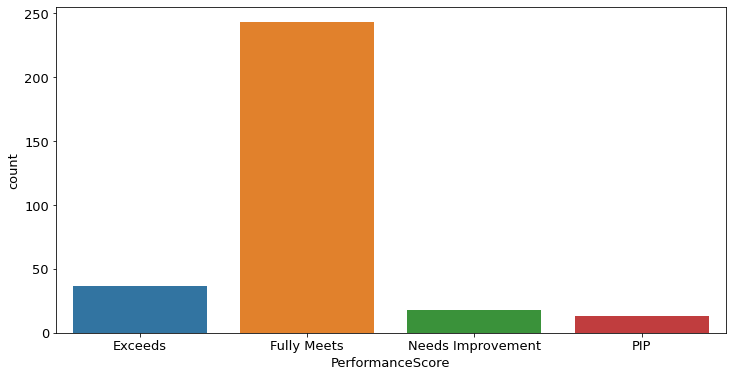

In [64]:
plt.figure(figsize=(12,6))
sns.countplot(x = "PerformanceScore", data=hr_data)

## What is the relationship between Recruitment Source & Performance Score?

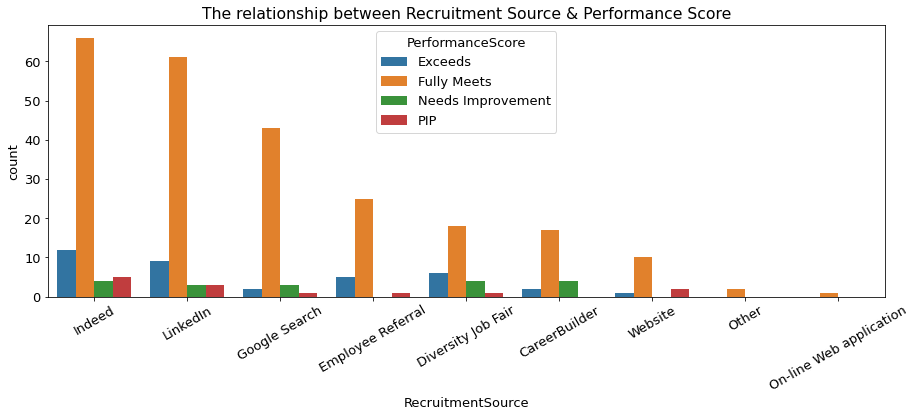

In [63]:
plt.figure(figsize = [15, 5])
Ord = hr_data['RecruitmentSource'].value_counts().index
sns.countplot(data= hr_data, x='RecruitmentSource', hue ='PerformanceScore', order=Ord);
plt.xticks(rotation=30);
plt.title('The relationship between Recruitment Source & Performance Score');

##What is the reason that has the highest percentage of employees likely to quit their job?

In [44]:
grouped_data = hr_data[hr_data['TermReason'] != 'N/A-StillEmployed']
grouped_data = grouped_data[grouped_data['TermReason'] != 'Another position']
grouped_data = grouped_data.groupby(['TermReason']).size().reset_index()
grouped_data.columns = ['TermReason','Count']
grouped_data = grouped_data.sort_values('Count', ascending = False)
print(grouped_data.Count.sum())
px.pie(grouped_data,
             values = 'Count', 
             names = 'TermReason',
             title = f"number of employees will leave the job : {grouped_data.Count.sum()} Employees")

84


RaceDesc                          Department          
American Indian or Alaska Native  Production                2
                                  Sales                     1
Asian                             IT/IS                     6
                                  Production               21
                                  Sales                     1
                                  Software Engineering      1
Black or African American         Admin Offices             5
                                  IT/IS                    15
                                  Production               45
                                  Sales                    10
                                  Software Engineering      5
Hispanic                          Production                1
Two or more races                 Production                6
                                  Sales                     5
White                             Admin Offices             4
               